# Single target detection (CW, splitbeam)

This notebook demonstrates single-target detection using:

- Narrowband (CW) data
- Split-beam geometry (beam_type = 1)
- A single channel

Data courtesy of the Swedish University of Agricultural Sciences, collected aboard the R/V Svea in the Baltic Sea by Jonas Hentati-Sundberg.


> ⚠️ **Note**  
> The workflow is currently demonstrated on the 38 kHz channel only. It will be extended in future versions to support multi-channel processing.

The split-beam single-target detection methods implemented here are based on the approaches described in [Matecho](https://www.researchgate.net/publication/325951128_Matecho_An_Open-Source_Tool_for_Processing_Fisheries_Acoustics_Data) and [Echoview](https://www.echoview.com). The algorithms are reimplemented in Python within echopype and may not reproduce the exact proprietary workflows or default parameter settings of the original software.

This notebook demonstrates how to:

- Convert raw data to an EchoData object
- Compute Sv and add split-beam angles
- Detect the seafloor
- Detect single targets from the ds_Sv dataset
- Apply an alternative workflow:
    - Compute TS first
    - Mask seafloor and surface saturation noise
    - Apply single-target detection
- Compare outputs from both approaches

> ⚠️ **Disclaimer**  
> This notebook relies on features that are not yet available in the latest official `echopype` release.  
> To run it, clone `echopype` and install it in editable mode:
>
> ```bash
> git clone https://github.com/OSOceanAcoustics/echopype.git
> cd echopype
> pip install -e ".[dev]"
> ```



## First, we import and process the example raw file.

In [1]:
from pathlib import Path
import echopype as ep

filepath = Path("../../../run_echopype_tests/data/Jonas_echoview/0_raw_data/D20230626-T235835.raw")
    
if not filepath.exists():
    raise FileNotFoundError(f"RAW file not found: {filepath.resolve()}")

ed = ep.open_raw(filepath, sonar_model="EK80")
ed

<EchoData: standardized raw data from Internal Memory>
Top-level: contains metadata about the SONAR-netCDF4 file format.
├── Environment: contains information relevant to acoustic propagation through water.
├── Platform: contains information about the platform on which the sonar is installed.
│   └── NMEA: contains information specific to the NMEA protocol.
├── Provenance: contains metadata about how the SONAR-netCDF4 version of the data were obtained.
├── Sonar: contains sonar system metadata and sonar beam groups.
│   └── Beam_group1: contains FM-only or CW-only complex backscatter data and other beam or channel-specific data.
└── Vendor_specific: contains vendor-specific information about the sonar and the data.

Next, we compute Sv, incorporate the transducer depth, and calculate the split-beam angles.

In [2]:
ds_Sv = ep.calibrate.compute_Sv(ed, waveform_mode="CW", encode_mode="complex")
ds_Sv = ep.consolidate.add_depth(ds_Sv, ed, depth_offset=0) # add 5.9 m
ds_Sv = ep.consolidate.add_splitbeam_angle(ds_Sv, ed, waveform_mode="CW", encode_mode="complex", to_disk=False)

We check if time is increasing.

In [3]:
from echopype.qc import exist_reversed_time, coerce_increasing_time

if exist_reversed_time(ds_Sv, "ping_time"):
    coerce_increasing_time(ds_Sv)

We print the channel names.

In [4]:
channel_names = ds_Sv['channel'].values
channel_names

array(['WBT 741110-15 ES18_ES', 'WBT 741862-15 ES38-7_ES',
       'WBT 741865-15 ES120-7C_ES', 'WBT 741869-15 ES70-7C_ES',
       'WBT 743335-15 ES333-7C_ES', 'WBT 743340-15 ES200-7C_ES'],
      dtype='<U25')

We plot the raw Sv data.

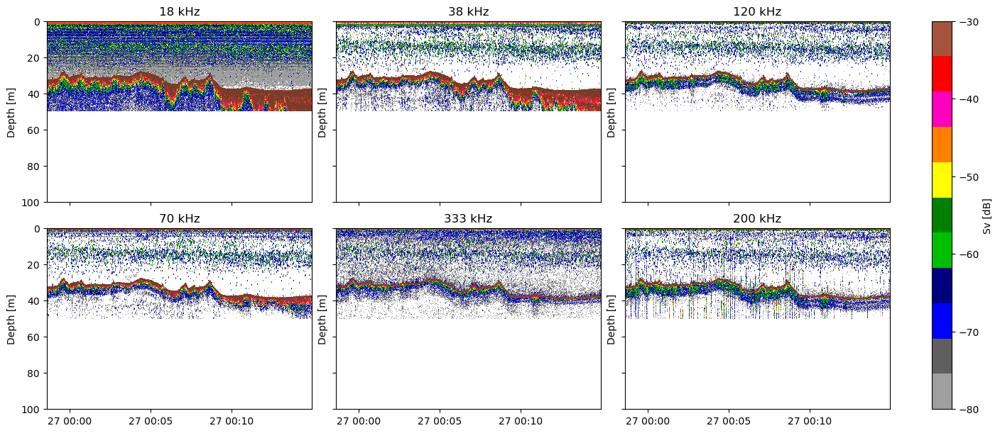

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import echopype.colormap

channels = ds_Sv.channel.values

fig, axes = plt.subplots(
    2, 3,
    figsize=(14, 6),
    sharex=True,
    sharey=True,
    constrained_layout=True,
)

axes = axes.ravel()

for ax, ch in zip(axes, channels):

    ds_ch = ds_Sv.sel(channel=ch)

    Sv = ds_ch["Sv"].values.T
    depth = ds_ch["depth"].values.T
    time = ds_ch["ping_time"].values

    # keep only rows with finite depth
    keep = np.any(np.isfinite(depth), axis=1)

    Sv = Sv[keep]
    depth = depth[keep]

    im = ax.pcolormesh(
        time,
        depth,
        Sv,
        shading="auto",
        vmin=-80,
        vmax=-30,
        cmap=mpl.colormaps["ep.ek500"],
    )

    ax.set_ylim(100, 0)
    ax.set_title(f"{float(ds_ch.frequency_nominal)/1000:.0f} kHz")
    ax.set_ylabel("Depth [m]")

fig.colorbar(
    im,
    ax=axes,
    label="Sv [dB]",
)

plt.show()

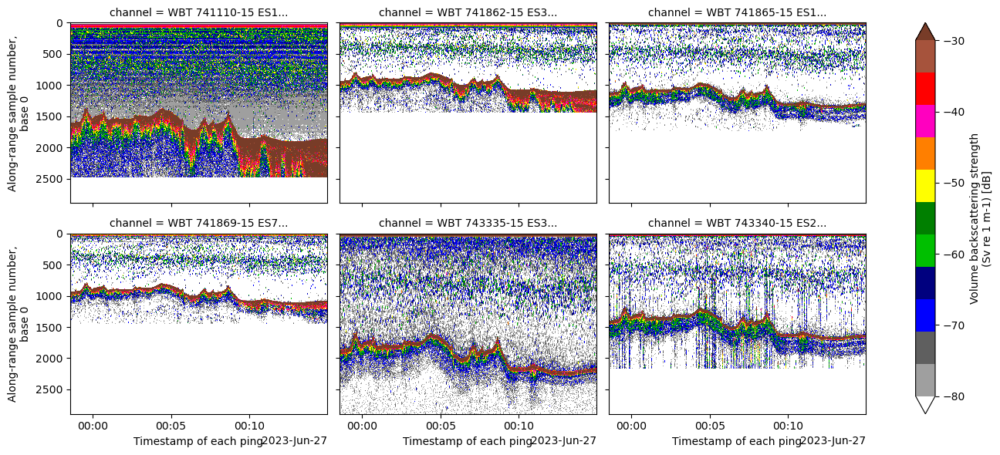

In [6]:
import matplotlib as mpl
import echopype.colormap

ds_Sv["Sv"].plot(
    x="ping_time",
    y="range_sample",
    row="channel", col_wrap=3,
    vmin=-80, vmax=-30,
    cmap=mpl.colormaps["ep.ek500"],
    yincrease=False,
    figsize=(14, 6),
)

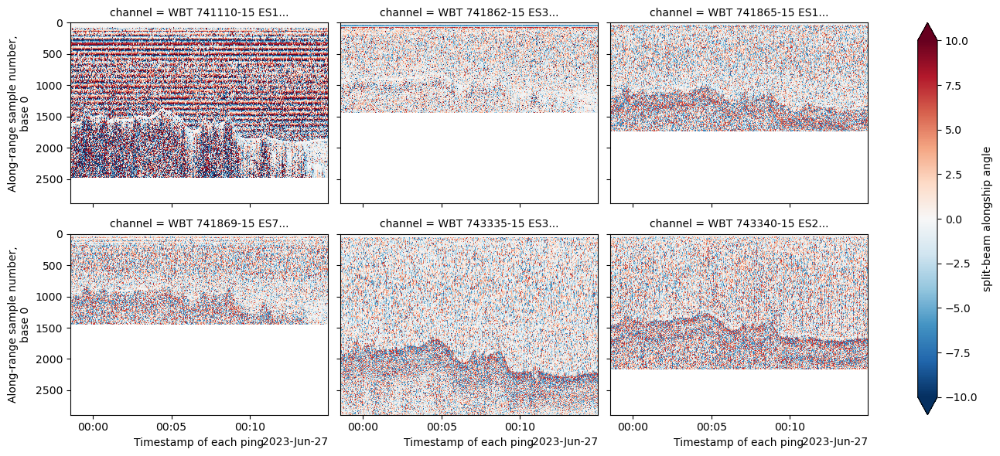

In [7]:
vmin, vmax = -10, 10

ds_Sv["angle_alongship"].plot(
    x="ping_time",
    y="range_sample",
    row="channel",
    col_wrap=3,
    yincrease=False,
    figsize=(14, 6),
    cmap="RdBu_r",
    vmin=vmin,
    vmax=vmax,
    center=0,
    extend=None,
)

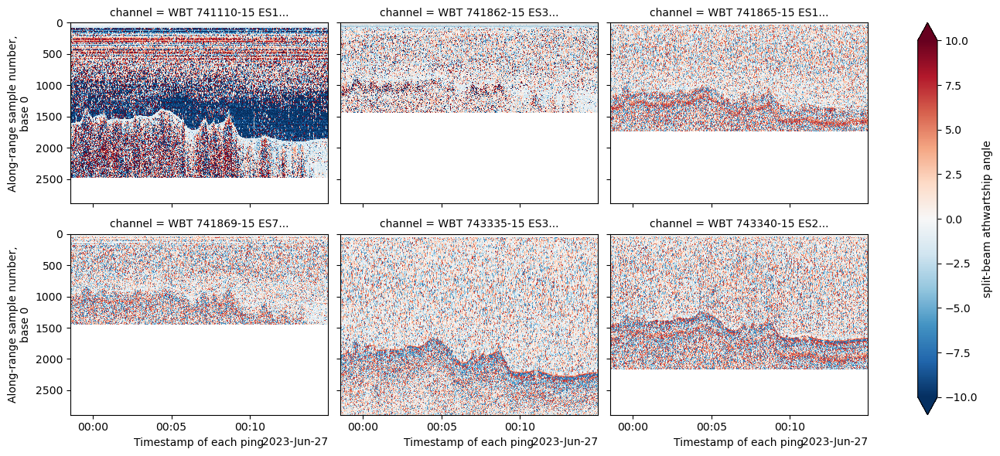

In [8]:
ds_Sv["angle_athwartship"].plot(
    x="ping_time",
    y="range_sample",
    row="channel",
    col_wrap=3,
    yincrease=False,
    figsize=(14, 6),
    cmap="RdBu_r",
    vmin=vmin,
    vmax=vmax,
    center=0,
    extend=None,
)

As stated in the introduction, we focus here on the 38 kHz channel for clarity. All other frequency channels are dropped.

In [9]:
ch38 = "WBT 741862-15 ES38-7_ES"

ds_Sv = ds_Sv.sel(channel=[ch38])
ds_Sv

<xarray.Dataset> Size: 309MB
Dimensions:                        (channel: 1, ping_time: 2667,
                                    range_sample: 2894, filenames: 1)
Coordinates:
  * channel                        (channel) <U25 100B 'WBT 741862-15 ES38-7_ES'
  * ping_time                      (ping_time) datetime64[ns] 21kB 2023-06-26...
  * range_sample                   (range_sample) int64 23kB 0 1 2 ... 2892 2893
  * filenames                      (filenames) int64 8B 0
Data variables: (12/28)
    Sv                             (channel, ping_time, range_sample) float64 62MB ...
    echo_range                     (channel, ping_time, range_sample) float64 62MB ...
    tau_effective                  (channel) float64 8B 0.0008314
    frequency_nominal              (channel) float64 8B 3.8e+04
    sound_speed                    float64 8B 1.44e+03
    sound_absorption               (channel) float64 8B 0.003039
    ...                             ...
    receiver_sampling_frequency    (channel) float64 8B 1.5e+06
    source_filenames               (filenames) <U80 320B '..\\..\\..\\run_ech...
    water_level                    float64 8B 0.0
    depth                          (channel, ping_time, range_sample) float64 62MB ...
    angle_alongship                (channel, ping_time, range_sample) float64 62MB ...
    angle_athwartship              (channel, ping_time, range_sample) float64 62MB ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.11.2.dev57+g1f9b67a33
    processing_time:              2026-06-21T01:42:21+00:00
    processing_function:          calibrate.compute_Sv

We use the Blackwell bottom detection function from the seafloor_detection module in the echopype.mask subpackage. Seafloor detection is performed on the 38 kHz channel, which is currently the only remaining channel in ds_Sv.

In [10]:
sel_channel = "WBT 741862-15 ES38-7_ES"

In [11]:
from echopype.mask import detect_seafloor

blackwell_bottom = detect_seafloor(
    ds=ds_Sv,
    method="blackwell",
    params={
        "var_name": "Sv",
        "channel": sel_channel,
        "threshold": [-40, 0.4, 0.4],
        "offset": 0.3,
        "r0": 15,
        "r1": 1000,
        "wtheta": 28,
        "wphi": 52,
    }
)

We verify that the bottom detection output has the expected structure and dimensions.

In [12]:
import xarray as xr

assert isinstance(blackwell_bottom, xr.DataArray)
assert set(blackwell_bottom.dims) == {"ping_time"}

blackwell_bottom

<xarray.DataArray 'bottom_depth' (ping_time: 2667)> Size: 21kB
array([31.8731256, 31.8731256, 31.8731256, ..., 37.0913232, 37.0913232,
       37.0913232], shape=(2667,))
Coordinates:
  * ping_time  (ping_time) datetime64[ns] 21kB 2023-06-26T23:58:35.018728 ......
Attributes:
    detector:               blackwell
    threshold_Sv:           -40.0
    threshold_angle_major:  0.4
    threshold_angle_minor:  0.4
    offset_m:               0.3
    channel:                WBT 741862-15 ES38-7_ES

We plot the detected bottom depth as a function of time to visually inspect the stability and continuity of the seafloor detection.

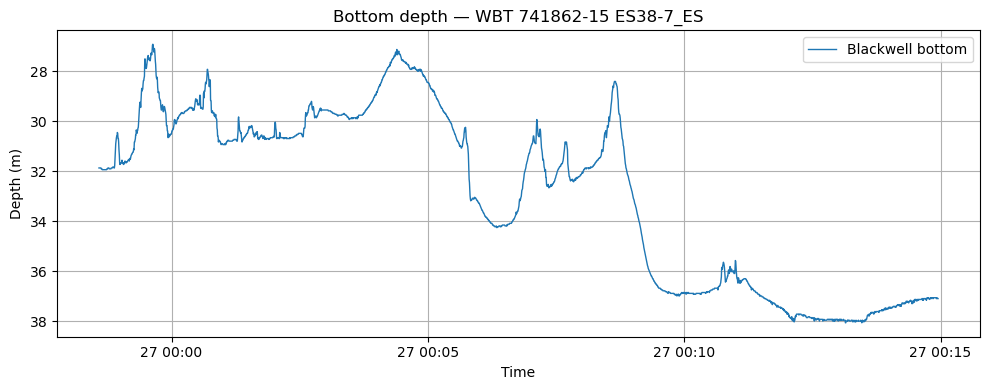

In [13]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
plt.plot(blackwell_bottom["ping_time"], blackwell_bottom,
         label="Blackwell bottom", lw=1)

plt.gca().invert_yaxis()
plt.ylabel("Depth (m)")
plt.xlabel("Time")
plt.title(f"Bottom depth — {sel_channel}")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Next, we restrict the dataset to range bins where the depth variable is finite across all ping times.

In [14]:
import numpy as np

valid = np.isfinite(ds_Sv["depth"]).all(
    dim=[d for d in ds_Sv["depth"].dims if d != "range_sample"]
)

print("Removed bins:", int((~valid).sum()), "/", valid.size)

ds_Sv = ds_Sv.isel(range_sample=valid)
ds_Sv

Removed bins: 1447 / 2894


<xarray.Dataset> Size: 154MB
Dimensions:                        (channel: 1, ping_time: 2667,
                                    range_sample: 1447, filenames: 1)
Coordinates:
  * channel                        (channel) <U25 100B 'WBT 741862-15 ES38-7_ES'
  * ping_time                      (ping_time) datetime64[ns] 21kB 2023-06-26...
  * range_sample                   (range_sample) int64 12kB 0 1 2 ... 1445 1446
  * filenames                      (filenames) int64 8B 0
Data variables: (12/28)
    Sv                             (channel, ping_time, range_sample) float64 31MB ...
    echo_range                     (channel, ping_time, range_sample) float64 31MB ...
    tau_effective                  (channel) float64 8B 0.0008314
    frequency_nominal              (channel) float64 8B 3.8e+04
    sound_speed                    float64 8B 1.44e+03
    sound_absorption               (channel) float64 8B 0.003039
    ...                             ...
    receiver_sampling_frequency    (channel) float64 8B 1.5e+06
    source_filenames               (filenames) <U80 320B '..\\..\\..\\run_ech...
    water_level                    float64 8B 0.0
    depth                          (channel, ping_time, range_sample) float64 31MB ...
    angle_alongship                (channel, ping_time, range_sample) float64 31MB ...
    angle_athwartship              (channel, ping_time, range_sample) float64 31MB ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.11.2.dev57+g1f9b67a33
    processing_time:              2026-06-21T01:42:21+00:00
    processing_function:          calibrate.compute_Sv

We extract a short time window and convert the data from range_sample to a physical depth coordinate by swapping dimensions.
We then visualise Sv and the split-beam angles (alongship and athwartship) as depth–time echograms, with the detected seafloor overlaid.

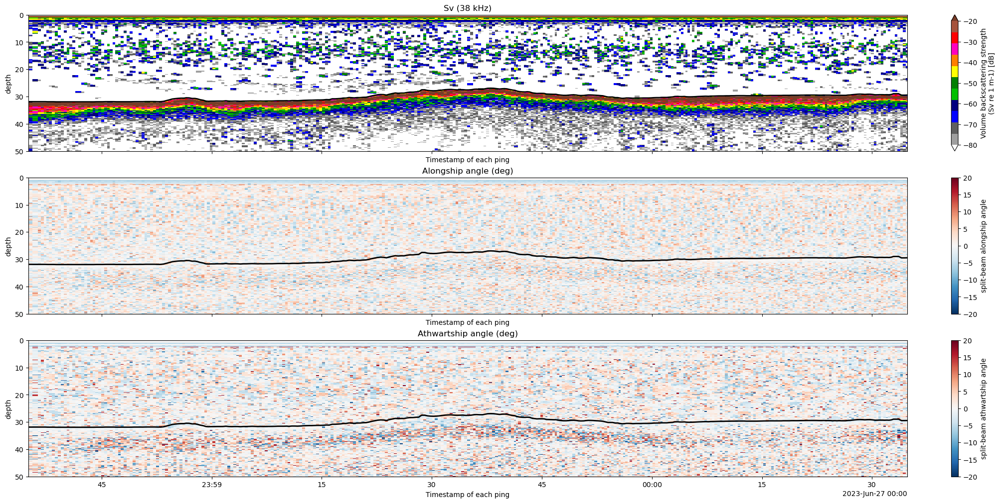

In [15]:
import matplotlib as mpl
import echopype.colormap

ds_Sv = ds_Sv.sortby("ping_time")
t0 = ds_Sv["ping_time"].values[0]
t1 = t0 + np.timedelta64(2, "m")

dsw = ds_Sv.sel(ping_time=slice(t0, t1))
bottom = blackwell_bottom.sel(ping_time=slice(t0, t1)).sortby("ping_time")

# 1D depth axis for range_sample (dataset already trimmed)
d = ds_Sv["depth"].isel(channel=0).sel(ping_time=t0, method="nearest").to_numpy()

def to_depth(da):
    if "channel" in da.dims:
        da = da.isel(channel=0)
    return da.assign_coords(depth=("range_sample", d)).swap_dims({"range_sample": "depth"})

Sv = to_depth(dsw["Sv"])
Al = to_depth(dsw["angle_alongship"])
At = to_depth(dsw["angle_athwartship"])

fig, axes = plt.subplots(3, 1, figsize=(20, 10), sharex=True, constrained_layout=True)

Sv.plot(ax=axes[0], x="ping_time", y="depth", yincrease=False,
        cmap=mpl.colormaps["ep.ek500"], vmin=-80, vmax=-20, add_colorbar=True, infer_intervals=False)
axes[0].plot(bottom["ping_time"], bottom, "k-", lw=2)

Al.plot(ax=axes[1], x="ping_time", y="depth", yincrease=False,
        cmap="RdBu_r", vmin=-20, vmax=20, add_colorbar=True, infer_intervals=False)
axes[1].plot(bottom["ping_time"], bottom, "k-", lw=2)

At.plot(ax=axes[2], x="ping_time", y="depth", yincrease=False,
        cmap="RdBu_r", vmin=-20, vmax=20, add_colorbar=True, infer_intervals=False)
axes[2].plot(bottom["ping_time"], bottom, "k-", lw=2)

for ax, title in zip(axes, ["Sv (38 kHz)", "Alongship angle (deg)", "Athwartship angle (deg)"]):
    ax.set_ylim(50, 0)
    ax.set_title(title)

plt.show()

## Next, we detect single targets using the Matecho method.

Before applying the single-target detector, we add a few variables from the Echodata object to ds_Sv.

Specifically, we add:
- transmit_duration_nominal
- sample_interval
- beam_type

The beam_type variable is used to verify that the data correspond to split-beam geometry (beam_type = 1), which is required by the single-target detector.

>⚠️ Note
>These variables are currently added manually. In future versions, all required metadata will be propagated automatically into ds_Sv during computation.

In [16]:
ds_Sv["transmit_duration_nominal"] = ed["Sonar/Beam_group1"]["transmit_duration_nominal"]
ds_Sv["sample_interval"] = ed["Sonar/Beam_group1"]["sample_interval"]
ds_Sv["beam_type"] = ed["Sonar/Beam_group1"]["beam_type"]

Next, we broadast the dimensions where necessary to ensure compatibility with vectorised computations.

In [17]:
ref = ds_Sv["sa_correction"]

ds_Sv["sound_absorption"] = ds_Sv["sound_absorption"].broadcast_like(ref)
ds_Sv["transducer_depth"] = xr.zeros_like(ref)
ds_Sv["heave_compensation"] = xr.zeros_like(ref)
ds_Sv["start_depth_m"] = xr.zeros_like(ref)

The detector takes Sv (dB) from ds_Sv as input and internally applies the Sv to TS transform (range term + sv2ts constant), plus absorption and beam compensation, to form the TS/TSu/Plike matrices used for detection.

>⚠️ Warning
>The single-target detector requires the effective pulse duration for correct TS scaling.
>This variable (tau_effective) is passed on to ds_Sv.
>At present, tau_effective is not yet returned for power-encoded EK80 data.

In [19]:
from echopype.mask import detect_single_targets

ch_req = ch38

my_params = {
    "channel": ch_req,
    "seafloor": blackwell_bottom,
    "min_threshold_db": -58.0,
    "max_angle_oneway_compression_db": 2.0,
    "max_phase_deviation_deg": 8.0,
    "min_echo_length_pulse": 0.7,
    "max_echo_length_pulse": 1.5,
    "min_echo_space_pulse": 1.0,
    "min_echo_depth_m": 3.0,
    "max_echo_depth_m": 43.4,
    "floor_filter_tolerance_m": 0.0,
}

st_m = detect_single_targets(
    ds_Sv,
    method="from_Sv",
    params=my_params,
)

print(st_m)

<xarray.Dataset> Size: 946kB
Dimensions:                   (target: 5376)
Coordinates:
  * target                    (target) int64 43kB 0 1 2 3 ... 5373 5374 5375
    ping_number               (target) int64 43kB 1 2 2 3 ... 2667 2667 2667
    channel                   <U23 92B 'WBT 741862-15 ES38-7_ES'
Data variables: (12/21)
    nb_valid_targets          int64 8B 5376
    ts_comp                   (target) float64 43kB -53.39 -52.32 ... -55.0
    ts_uncomp                 (target) float64 43kB -56.95 -54.63 ... -58.83
    target_range              (target) float64 43kB 12.74 23.94 ... 31.68 15.79
    target_range_disp         (target) float64 43kB 12.74 23.94 ... 31.68 15.79
    target_range_min          (target) float64 43kB 3.0 3.0 3.0 ... 3.0 3.0 3.0
    ...                        ...
    pitch                     (target) float64 43kB nan nan nan ... nan nan nan
    heading                   (target) float64 43kB nan nan nan ... nan nan nan
    dist                      (target)

<!-- 
[SHIFT] StartDepthSample (1-based): min=1 max=1 mean=1.000000
[SHIFT] nbSamp: before=1447 after=1447

[STEP 1] Matrix Extraction (WBT 741862-15 ES38-7_ES)
  nbSamp (last_idx): 1447
  Delta extracted  : 0.0345576000
C:\Users\lloyd\Desktop\my_echopype\dev\echopype\echopype\mask\single_target_detection\detect_matecho.py:1192: UserWarning: [Cond 7] Echo length (L6dB):
  nech_p=21.333 | MinEchoLengthPulse=0.700 | MaxEchoLengthPulse=1.500
  L6dB: min=3 med=19 max=95
  Bounds [15..32] samples (from nech_p*Min/MaxEchoLengthPulse)
  Passing: 9255 / 13000
  c7 = _cond_7_echo_length(
<xarray.Dataset> Size: 860kB
Dimensions:                   (target: 5376)
Coordinates:
  * target                    (target) int32 22kB 0 1 2 3 ... 5373 5374 5375
    ping_number               (target) int32 22kB 1 2 2 3 ... 2667 2667 2667
    channel                   <U23 92B 'WBT 741862-15 ES38-7_ES'
Data variables: (12/21)
    nb_valid_targets          int32 4B 5376
    ts_comp                   (target) float64 43kB -53.39 -52.32 ... -55.0
    ts_uncomp                 (target) float64 43kB -56.95 -54.63 ... -58.83
    target_range              (target) float64 43kB 12.74 23.94 ... 31.68 15.79
    target_range_disp         (target) float64 43kB 12.74 23.94 ... 31.68 15.79
    target_range_min          (target) float64 43kB 3.0 3.0 3.0 ... 3.0 3.0 3.0
    ...                        ...
    pitch                     (target) float64 43kB nan nan nan ... nan nan nan
    heading                   (target) float64 43kB nan nan nan ... nan nan nan
    dist                      (target) float64 43kB nan nan nan ... nan nan nan
    ping_time                 (target) datetime64[ns] 43kB 2023-06-26T23:58:3...
    range_sample              (target) int32 22kB 369 693 385 ... 773 917 457
    frequency_nominal         (target) float64 43kB 3.8e+04 3.8e+04 ... 3.8e+04
Attributes:
    method:            matecho
    channel:           WBT 741862-15 ES38-7_ES
    nb_valid_targets:  5376 -->

We convert the Matecho single-target output into Python-indexed ping positions and depth coordinates, grouped by frequency (kHz), so they can be overlaid on echograms.

In [20]:
def targets_by_freq_from_st_m(ds_Sv, st_m, *, channel_dim="channel"):
    if "frequency_nominal" not in ds_Sv:
        raise ValueError("ds_Sv is missing frequency_nominal; pass freq_khz explicitly instead.")

    fn = ds_Sv["frequency_nominal"]

    if fn.size == 1:
        freq_hz = float(fn.values.item())
    else:
        freq_hz = float(fn.sel({channel_dim: ds_Sv[channel_dim]}).values.item())

    freq = int(np.rint(freq_hz / 1e3))

    x_idx = st_m["ping_number"].values.astype(np.int64) - 1
    y = (st_m["Target_range_disp"] if "Target_range_disp" in st_m else st_m["target_range"]).values.astype(float)

    ok = np.isfinite(y) & (x_idx >= 0) & (x_idx < ds_Sv.sizes["ping_time"])
    return {freq: (x_idx[ok], y[ok])}
targets_by_freq_new = targets_by_freq_from_st_m(ds_Sv, st_m)

We extract the ping indices and target depths for the 38 kHz channel and convert ping indices to their corresponding timestamps.
The detected targets are then plotted as depth–time points for visual inspection.

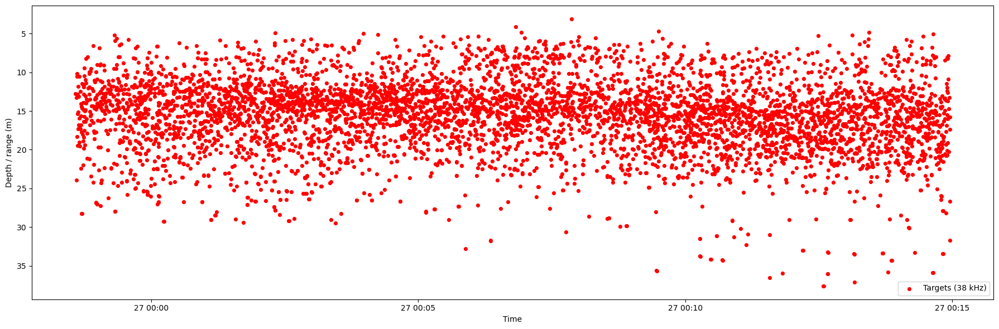

In [21]:
x_idx, y = targets_by_freq_new[38]

t = ds_Sv["ping_time"].values[x_idx]

plt.figure(figsize=(18, 6))
plt.scatter(t, y, s=18, c="red", marker="o", linewidths=0.9, label="Targets (38 kHz)")
plt.gca().invert_yaxis()
plt.ylabel("Depth / range (m)")
plt.xlabel("Time")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

We extract a short 2-minute time window and visualise the 38 kHz echogram (Sv) in depth–time space.
The 1D depth vector is attached to the acoustic data and used as the vertical axis for plotting.

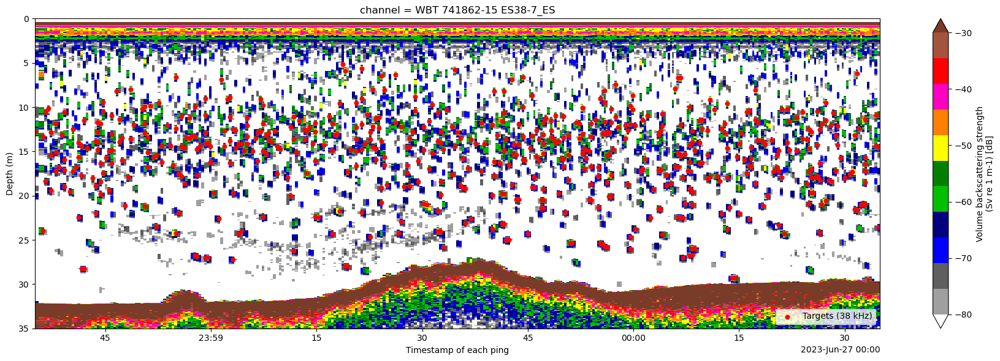

In [22]:
import pandas as pd

# 2-min window from t0 (match ds_Sv ping_time dtype)
t0p = pd.to_datetime(t0).tz_localize(None) if pd.Timestamp(t0).tzinfo else pd.to_datetime(t0)
t1p = t0p + pd.Timedelta(minutes=2)

# Sv over window (single channel)
Sv = ds_Sv["Sv"].isel(channel=0).sel(ping_time=slice(t0p, t1p)) if "channel" in ds_Sv["Sv"].dims else ds_Sv["Sv"].sel(ping_time=slice(t0p, t1p))

# build 1D depth axis and swap dims (range_sample -> depth_m)
depth1d = ds_Sv["depth"].isel(channel=0).sel(ping_time=t0p, method="nearest").to_numpy()
depth1d = np.maximum.accumulate(depth1d) + np.arange(depth1d.size) * 1e-9  # strictly increasing

Sv_d = Sv.assign_coords(depth_m=("range_sample", depth1d)).swap_dims({"range_sample": "depth_m"})

# targets (map ping idx -> time), then keep only those inside window
x_idx, y = targets_by_freq_new[38]
t = ds_Sv["ping_time"].values[x_idx]
ok = (t >= np.datetime64(t0p)) & (t <= np.datetime64(t1p))
t, y = t[ok], y[ok]

# plot
fig, ax = plt.subplots(figsize=(18, 6))
Sv_d.plot(
    ax=ax, x="ping_time", y="depth_m", yincrease=False,
    cmap=mpl.colormaps["ep.ek500"], vmin=-80, vmax=-30,
    add_colorbar=True, infer_intervals=False
)

ax.scatter(t, y, s=24, c="red", marker="o", linewidths=0.9, label="Targets (38 kHz)")
ax.set_ylabel("Depth (m)")
ax.set_ylim(35, 0)
ax.set_xlim(t0p, t1p)
ax.legend(loc="lower right")
plt.tight_layout()
plt.show()

## We now apply a split-beam single-target detection approach based on Echoview’s Method 2 algorithm.

In this workflow, target strength (TS) is computed explicitly before detection.  
The detector follows the methodological principles described for [Echoview’s Single Target Detection – Split Beam Method 2](https://support.echoview.com/WebHelp/Reference/Algorithms/Operators/Single_Target_Detection/Single_target_detection_split_beam_method_2.htm).

In [25]:
# 1. Compute Sp first
ds_Sp = ep.calibrate.compute_Sp(
    ed,
    waveform_mode="CW",
    encode_mode="complex",
)

ds_Sp = ep.consolidate.add_splitbeam_angle(
    ds_Sp,
    ed,
    waveform_mode="CW",
    encode_mode="complex",
    to_disk=False,
)

ds_Sp

<xarray.Dataset> Size: 1GB
Dimensions:                        (channel: 6, ping_time: 2667,
                                    range_sample: 2894, filenames: 1)
Coordinates:
  * channel                        (channel) <U25 600B 'WBT 741110-15 ES18_ES...
  * ping_time                      (ping_time) datetime64[ns] 21kB 2023-06-26...
  * range_sample                   (range_sample) int64 23kB 0 1 2 ... 2892 2893
  * filenames                      (filenames) int64 8B 0
Data variables: (12/26)
    Sp                             (channel, ping_time, range_sample) float64 370MB ...
    echo_range                     (channel, ping_time, range_sample) float64 370MB ...
    frequency_nominal              (channel) float64 48B 1.8e+04 ... 2e+05
    sound_speed                    float64 8B 1.44e+03
    sound_absorption               (channel) float64 48B 0.0008724 ... 0.02312
    temperature                    float64 8B 5.4
    ...                             ...
    impedance_transceiver          (channel) int64 48B 5400 5400 ... 5400 5400
    receiver_sampling_frequency    (channel) float64 48B 1.5e+06 ... 1.5e+06
    source_filenames               (filenames) <U80 320B '..\\..\\..\\run_ech...
    water_level                    float64 8B 0.0
    angle_alongship                (channel, ping_time, range_sample) float64 370MB ...
    angle_athwartship              (channel, ping_time, range_sample) float64 370MB ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.11.2.dev57+g1f9b67a33
    processing_time:              2026-06-21T01:47:51+00:00
    processing_function:          calibrate.compute_Sp

Like for ds_Sv, we restrict the analysis to the 38 kHz split-beam channel; all subsequent steps are performed on this subset.

In [27]:
def make_single_channel_range_dataset(ds_ts: xr.Dataset, channel: str) -> xr.Dataset:
    ds1 = ds_ts.sel(channel=[channel])

    if "echo_range" in ds1:
        depth_da = ds1["echo_range"].isel(ping_time=0)
    elif "depth" in ds1:
        depth_da = ds1["depth"].isel(ping_time=0)
    else:
        raise KeyError("ds_ts has neither 'echo_range' nor 'depth' to build depth coordinate.")

    if "channel" in depth_da.dims:
        depth_da = depth_da.isel(channel=0)

    depth_1d = np.asarray(depth_da.values).squeeze()

    out = ds1.assign_coords(depth=("range_sample", depth_1d))

    return out

ds_single_Sp = make_single_channel_range_dataset(ds_Sp, ch38)
ds_single_Sp

<xarray.Dataset> Size: 247MB
Dimensions:                        (channel: 1, ping_time: 2667,
                                    range_sample: 2894, filenames: 1)
Coordinates:
  * channel                        (channel) <U25 100B 'WBT 741862-15 ES38-7_ES'
  * ping_time                      (ping_time) datetime64[ns] 21kB 2023-06-26...
  * range_sample                   (range_sample) int64 23kB 0 1 2 ... 2892 2893
    depth                          (range_sample) float64 23kB 0.0 ... nan
  * filenames                      (filenames) int64 8B 0
Data variables: (12/26)
    Sp                             (channel, ping_time, range_sample) float64 62MB ...
    echo_range                     (channel, ping_time, range_sample) float64 62MB ...
    frequency_nominal              (channel) float64 8B 3.8e+04
    sound_speed                    float64 8B 1.44e+03
    sound_absorption               (channel) float64 8B 0.003039
    temperature                    float64 8B 5.4
    ...                             ...
    impedance_transceiver          (channel) int64 8B 5400
    receiver_sampling_frequency    (channel) float64 8B 1.5e+06
    source_filenames               (filenames) <U80 320B '..\\..\\..\\run_ech...
    water_level                    float64 8B 0.0
    angle_alongship                (channel, ping_time, range_sample) float64 62MB ...
    angle_athwartship              (channel, ping_time, range_sample) float64 62MB ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.11.2.dev57+g1f9b67a33
    processing_time:              2026-06-21T01:47:51+00:00
    processing_function:          calibrate.compute_Sp

The seafloor is requiered by the Matecho-style detector for the bottom gate (Cond-4), which excludes detections below the seabed.

In [28]:
df = pd.DataFrame({
    "time": blackwell_bottom["ping_time"].values,
    "depth": blackwell_bottom.values,
})

df.to_csv("./example_data/single_target_detection/bottom_depth_TS38.csv", index=False)

d = ds_single_Sp["depth"].values.astype(float)

print("depth size:", d.size)
print("NaNs:", np.isnan(d).sum())
print("min/max:", np.nanmin(d), np.nanmax(d))

dd = d[np.isfinite(d)]
print("finite size:", dd.size)
print("any decrease:", np.any(np.diff(dd) < 0))
print("n decreases:", np.sum(np.diff(dd) < 0))
print("n duplicates:", np.sum(np.diff(dd) == 0))

depth size: 2894
NaNs: 1447
min/max: 0.0 49.9702896
finite size: 1447
any decrease: False
n decreases: 0
n duplicates: 0


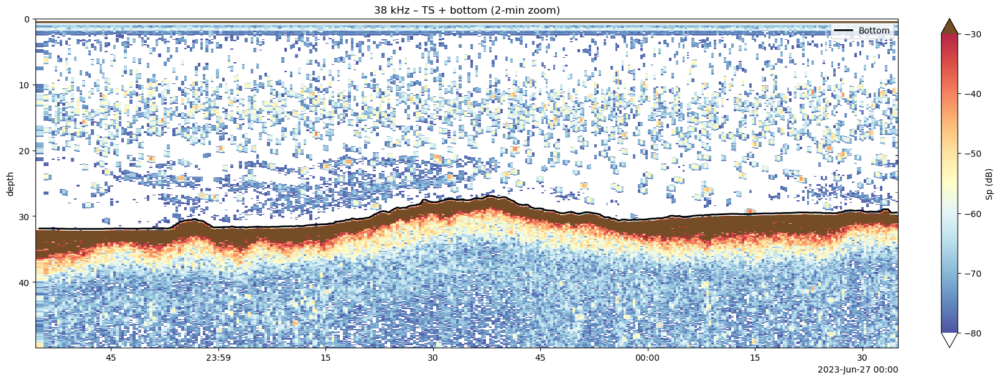

In [32]:
import re
import echoregions as er

vmin, vmax = -80, -30
cmap = "RdYlBu_r"

ch_req = "38kHz"  # or "WBT 741862-15 ES38-7_ES"

# Zoom control
zoom_2min = True
zoom_mode = "start"
center_ping_idx = 1000

# Parse requested frequency
mreq = re.search(r"(\d+)\s*k?hz", str(ch_req), flags=re.IGNORECASE)
if not mreq:
    raise ValueError(f"Cannot parse frequency from ch_req={ch_req!r}")
freq_khz = int(mreq.group(1))

# Select channel (TS dataset)
channels = ds_Sp["channel"].values.astype(str)

# Match either "...ES38..." or "... 38kHz ..." style
ch_matches = [
    ch for ch in channels
    if re.search(rf"(?i)ES{freq_khz}\b", ch) or re.search(rf"(?i)\b{freq_khz}\s*k?hz\b", ch)
]
if len(ch_matches) != 1:
    raise ValueError(f"{freq_khz} kHz channel not uniquely identified: {ch_matches}")

ch_lab = ch_matches[0]
dsch = ds_Sp.sel(channel=ch_lab)

# Build depth-view (depth as coordinate)
if "echo_range" in dsch:
    depth_1d = dsch["echo_range"].isel(ping_time=0).values
elif "depth" in dsch:
    depth_1d = dsch["depth"].isel(ping_time=0).values
else:
    raise KeyError("Need 'echo_range' or 'depth' in ds_TS to build depth axis.")

valid = np.isfinite(depth_1d)
dsch = dsch.isel(range_sample=np.where(valid)[0])
depth_1d = depth_1d[valid]

dsch = (
    dsch
    .assign_coords(depth=("range_sample", depth_1d))
    .swap_dims({"range_sample": "depth"})
    .sortby("ping_time")
    .sortby("depth")
)

# Read bottom line
lines = er.read_lines_csv("./example_data/single_target_detection/bottom_depth_TS38.csv")

# Optional: 2-minute zoom
if zoom_2min:
    if zoom_mode == "start":
        t0 = dsch["ping_time"].isel(ping_time=0).values
        t1 = t0 + np.timedelta64(2, "m")
    elif zoom_mode == "center":
        tc = dsch["ping_time"].isel(ping_time=center_ping_idx).values
        t0 = tc - np.timedelta64(1, "m")
        t1 = tc + np.timedelta64(1, "m")
    else:
        raise ValueError("zoom_mode must be 'start' or 'center'")

    dsch_plot = dsch.sel(ping_time=slice(t0, t1))

    mask = (lines.data["time"] >= t0) & (lines.data["time"] <= t1)
    bottom_time = lines.data["time"][mask]
    bottom_depth = lines.data["depth"][mask]

    title_suffix = " (2-min zoom)"
else:
    dsch_plot = dsch
    bottom_time = lines.data["time"]
    bottom_depth = lines.data["depth"]
    title_suffix = ""

# plot
fig, ax = plt.subplots(figsize=(16, 6), constrained_layout=True)

qm = dsch_plot["Sp"].plot(
    ax=ax,
    x="ping_time",
    y="depth",
    yincrease=False,
    vmin=vmin,
    vmax=vmax,
    cmap=cmap,
    add_colorbar=False,
    alpha=0.85,
)

qm.set_clim(vmin, vmax)
qm.cmap.set_under("white")
qm.cmap.set_over("#5c2e00")
ax.plot(bottom_time, bottom_depth, color="black", lw=2, label="Bottom")
ax.set_title(f"{freq_khz} kHz – TS + bottom{title_suffix}")
ax.set_xlabel("")
ax.legend(loc="upper right")
cbar = fig.colorbar(qm, ax=ax, extend="both")
cbar.set_label("Sp (dB)")

plt.show()

We apply a bottom-line mask to the TS data in order to exclude samples below the detected seabed. The mask is generated using the previously estimated bottom line and applied to the single-channel TS echogram:

In [33]:
bottom_mask_da, bottom_points = lines.seafloor_mask(
    ds_single_Sp["Sp"].isel(channel=0),
    operation="above_below",
    method="slinear",
    limit_area=None,
    limit_direction="both",
)

print("Unique values in bottom_mask_da:", np.unique(bottom_mask_da.data))

Unique values in bottom_mask_da: [0 1]


We invert the bottom mask to keep only the water column, reshape it to match the (ping_time, range_sample, channel) dimensions of TS, and apply it with .where().

As a result, all samples below the seafloor are set to NaN, ensuring that single-target detection is restricted to the water column only.

In [35]:
# bottom_mask_da is (ping_time, depth) where depth is a coord on range_sample
keep_mask = ~bottom_mask_da.astype(bool)

# make mask dims match TS: (ping_time, range_sample)
# (depth is a coordinate; the dimension is still range_sample)
keep_mask = keep_mask.transpose("ping_time", "range_sample")

# add channel dim (size=1) to match ds_single_TS["TS"]
keep_mask = keep_mask.expand_dims(channel=ds_single_Sp.channel)

# apply
ds_TS_masked = ds_single_Sp.copy()
ds_TS_masked["Sp"] = ds_single_Sp["Sp"].where(keep_mask)

Plot the resulting data.

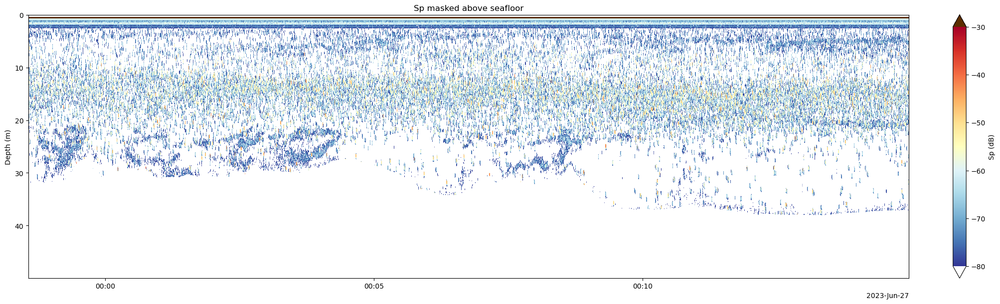

In [37]:
da = ds_TS_masked["Sp"].isel(channel=0)

depth1d = ds_TS_masked["depth"].values.astype(float)
valid = np.isfinite(depth1d)

da_plot = (
    da.isel(range_sample=valid)
      .assign_coords(depth=("range_sample", depth1d[valid]))
      .swap_dims({"range_sample": "depth"})
      .sortby("depth")
)

vmin, vmax = -80, -30
cmap = "RdYlBu_r"

fig, ax = plt.subplots(figsize=(20, 6), constrained_layout=True)

qm = da_plot.plot(
    ax=ax,
    x="ping_time",
    y="depth",
    yincrease=False,
    vmin=vmin,
    vmax=vmax,
    cmap=cmap,
    add_colorbar=False,
)

qm.set_clim(vmin, vmax)
qm.cmap.set_under("white")
qm.cmap.set_over("#5c2e00")

cbar = fig.colorbar(qm, ax=ax, extend="both")
cbar.set_label("Sp (dB)")

ax.set_title("Sp masked above seafloor")
ax.set_xlabel("")
ax.set_ylabel("Depth (m)")

plt.show()

We then mask the surface by discarding samples shallower than z_min (here 5 m). We build a depth-based keep mask, broadcast it to the TS grid (and channel), combine it with the seafloor keep mask, then apply the combined mask so TS is retained only between the surface cutoff and the bottom line.

In [39]:
from echopype.mask import apply_mask

z_min = 5.0  # meters

depth_mask = ds_TS_masked["depth"] >= z_min
depth_mask_2d = depth_mask.broadcast_like(ds_TS_masked["Sp"].isel(channel=0))
depth_mask_3d = depth_mask_2d.expand_dims(channel=ds_TS_masked.channel)

# combine with bottom keep mask
keep_combined = keep_mask & depth_mask_3d

# apply mask
ds_Sp_masked_surf = apply_mask(
    ds_single_Sp,
    keep_combined,
    var_name="Sp",
    fill_value=np.nan,
)
ds_Sp_masked_surf

<xarray.Dataset> Size: 247MB
Dimensions:                        (channel: 1, ping_time: 2667,
                                    range_sample: 2894, filenames: 1)
Coordinates:
  * channel                        (channel) object 8B 'WBT 741862-15 ES38-7_ES'
  * ping_time                      (ping_time) datetime64[ns] 21kB 2023-06-26...
  * range_sample                   (range_sample) int64 23kB 0 1 2 ... 2892 2893
    depth                          (range_sample) float64 23kB 0.0 ... nan
  * filenames                      (filenames) int64 8B 0
Data variables: (12/26)
    Sp                             (channel, ping_time, range_sample) float64 62MB ...
    echo_range                     (channel, ping_time, range_sample) float64 62MB ...
    frequency_nominal              (channel) float64 8B 3.8e+04
    sound_speed                    float64 8B 1.44e+03
    sound_absorption               (channel) float64 8B 0.003039
    temperature                    float64 8B 5.4
    ...                             ...
    impedance_transceiver          (channel) int64 8B 5400
    receiver_sampling_frequency    (channel) float64 8B 1.5e+06
    source_filenames               (filenames) <U80 320B '..\\..\\..\\run_ech...
    water_level                    float64 8B 0.0
    angle_alongship                (channel, ping_time, range_sample) float64 62MB ...
    angle_athwartship              (channel, ping_time, range_sample) float64 62MB ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.11.2.dev57+g1f9b67a33
    processing_time:              2026-06-21T01:47:51+00:00
    processing_function:          calibrate.compute_Sp
    mask_software_name:           echopype
    mask_software_version:        0.11.2.dev57+g1f9b67a33
    mask_time:                    2026-06-21T01:53:14+00:00
    mask_function:                mask.apply_mask

Plot the result

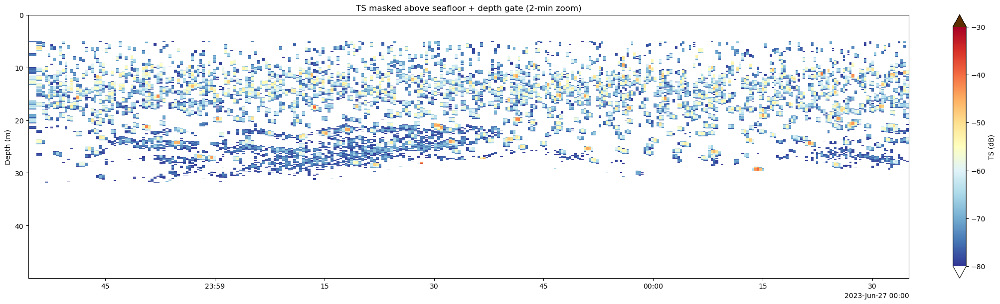

In [ ]:
t0 = ds_Sp_masked_surf["ping_time"].isel(ping_time=0).values
t1 = t0 + np.timedelta64(2, "m")

ds_zoom = ds_Sp_masked_surf.sel(ping_time=slice(t0, t1))

da = ds_zoom["Sp"].isel(channel=0)  # dims: (ping_time, range_sample)

depth1d = ds_zoom["depth"].values.astype(float)  # coord on range_sample
valid = np.isfinite(depth1d)

da_plot = (
    da.isel(range_sample=valid)
      .assign_coords(depth=("range_sample", depth1d[valid]))
      .swap_dims({"range_sample": "depth"})
      .sortby("depth")
)

fig, ax = plt.subplots(figsize=(20, 6), constrained_layout=True)

qm = da_plot.plot(
    ax=ax,
    x="ping_time",
    y="depth",
    yincrease=False,
    vmin=vmin,
    vmax=vmax,
    cmap=cmap,
    add_colorbar=False,
)

qm.set_clim(vmin, vmax)
qm.cmap.set_under("white")
qm.cmap.set_over("#5c2e00")

cbar = fig.colorbar(qm, ax=ax, extend="both")
cbar.set_label("Sp (dB)")

ax.set_title("Sp masked above seafloor + depth gate (2-min zoom)")
ax.set_xlabel("")
ax.set_ylabel("Depth (m)")
plt.show()

We then attach the required detector metadata (tau_effective, sample_interval, and beam_type) to the masked TS dataset, aligning them to the TS ping_time and ensuring the channel dimension matches.

In [41]:
ch = str(ds_Sp_masked_surf["channel"].values[0])
ping_time_tgt = ds_Sp_masked_surf["ping_time"]

# tau_effective (seconds)
tau_effective = ds_Sv["tau_effective"].sel(channel=ch)

if "ping_time" in tau_effective.dims:
    tau_effective = tau_effective.sel(ping_time=ping_time_tgt, method="nearest")

if "channel" not in tau_effective.dims:
    tau_effective = tau_effective.expand_dims(channel=ds_Sp_masked_surf.channel)

# sample_interval (seconds)
sample_interval = ds_Sv["sample_interval"].sel(channel=ch)

if "ping_time" in sample_interval.dims:
    sample_interval = sample_interval.sel(ping_time=ping_time_tgt, method="nearest")

if "channel" not in sample_interval.dims:
    sample_interval = sample_interval.expand_dims(channel=ds_Sp_masked_surf.channel)

# Build final dataset
ds_TS_angles = ds_Sp_masked_surf.assign(
    tau_effective=tau_effective,
    sample_interval=sample_interval,
    beam_type=xr.DataArray(
        np.full(ds_Sp_masked_surf.sizes["channel"], 65, dtype=np.int32),
        dims=("channel",),
    ),
)

ds_TS_angles

<xarray.Dataset> Size: 247MB
Dimensions:                        (channel: 1, ping_time: 2667,
                                    range_sample: 2894, filenames: 1)
Coordinates:
  * channel                        (channel) object 8B 'WBT 741862-15 ES38-7_ES'
  * ping_time                      (ping_time) datetime64[ns] 21kB 2023-06-26...
  * range_sample                   (range_sample) int64 23kB 0 1 2 ... 2892 2893
    depth                          (range_sample) float64 23kB 0.0 ... nan
  * filenames                      (filenames) int64 8B 0
Data variables: (12/29)
    Sp                             (channel, ping_time, range_sample) float64 62MB ...
    echo_range                     (channel, ping_time, range_sample) float64 62MB ...
    frequency_nominal              (channel) float64 8B 3.8e+04
    sound_speed                    float64 8B 1.44e+03
    sound_absorption               (channel) float64 8B 0.003039
    temperature                    float64 8B 5.4
    ...                             ...
    water_level                    float64 8B 0.0
    angle_alongship                (channel, ping_time, range_sample) float64 62MB ...
    angle_athwartship              (channel, ping_time, range_sample) float64 62MB ...
    tau_effective                  (channel) float64 8B 0.0008314
    sample_interval                (channel, ping_time) float64 21kB 4.8e-05 ...
    beam_type                      (channel) int32 4B 65
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.11.2.dev57+g1f9b67a33
    processing_time:              2026-06-21T01:47:51+00:00
    processing_function:          calibrate.compute_Sp
    mask_software_name:           echopype
    mask_software_version:        0.11.2.dev57+g1f9b67a33
    mask_time:                    2026-06-21T01:53:14+00:00
    mask_function:                mask.apply_mask

We drop the channel.

In [43]:
ch = str(ds_TS_angles["channel"].values[0])
ds_m2 = ds_TS_angles.sel(channel=ch)

if "channel" in ds_m2.dims:
    ds_m2 = ds_m2.squeeze("channel", drop=True)

assert ds_m2["Sp"].dims == ("ping_time", "range_sample"), ds_m2["Sp"].dims

We launch the detector.

In [ ]:
ts_threshold_db = -58.0

my_params = {
    "pldl_db": 6.0,
    "min_norm_pulse": 0.7,
    "max_norm_pulse": 1.5,
    "beam_comp_model": "simrad_lobe",
    "max_beam_comp_db": 4.0,
    "max_sd_minor_deg": 0.6,
    "max_sd_major_deg": 0.6,
    "bottom_offset_m": 1.0,
}

st_ev = detect_single_targets(
    ds_m2,
    method="from_Sp",
    params=my_params,
)

print(st_ev)

<xarray.Dataset> Size: 520kB
Dimensions:            (target: 4644)
Coordinates:
  * target             (target) int64 37kB 0 1 2 3 4 ... 4640 4641 4642 4643
Data variables: (12/13)
    ping_time          (target) datetime64[ns] 37kB 2023-06-26T23:58:35.01872...
    range_sample       (target) int64 37kB 172 374 744 340 ... 379 451 496 767
    frequency_nominal  (target) float64 37kB 3.8e+04 3.8e+04 ... 3.8e+04 3.8e+04
    ping_index         (target) int64 37kB 0 0 0 1 1 ... 2665 2666 2666 2666
    iinf               (target) int64 37kB 166 360 730 337 ... 376 449 493 764
    isup               (target) int64 37kB 178 378 748 355 ... 394 465 511 782
    ...                 ...
    norm_pulse_len     (target) float64 37kB 0.7506 1.097 1.097 ... 1.097 1.097
    target_range       (target) float64 37kB 5.944 12.92 25.71 ... 17.14 26.51
    angle_major_deg    (target) float64 37kB 1.482 2.311 1.043 ... 1.516 0.8521
    angle_minor_deg    (target) float64 37kB -0.2537 0.8338 ... -0.569 1.231

In [ ]:
ds_TS_targets = ep.calibrate.compute_TS(
    ed,
    waveform_mode="CW",
    encode_mode="complex",
    point_locations=st_ev,
)

ds_TS_targets = ds_TS_targets.where(
    ds_TS_targets["TS"] >= ts_threshold_db,
    drop=True,
)

Plot

In [47]:
ds_Sp

<xarray.Dataset> Size: 1GB
Dimensions:                        (channel: 6, ping_time: 2667,
                                    range_sample: 2894, filenames: 1)
Coordinates:
  * channel                        (channel) <U25 600B 'WBT 741110-15 ES18_ES...
  * ping_time                      (ping_time) datetime64[ns] 21kB 2023-06-26...
  * range_sample                   (range_sample) int64 23kB 0 1 2 ... 2892 2893
  * filenames                      (filenames) int64 8B 0
Data variables: (12/26)
    Sp                             (channel, ping_time, range_sample) float64 370MB ...
    echo_range                     (channel, ping_time, range_sample) float64 370MB ...
    frequency_nominal              (channel) float64 48B 1.8e+04 ... 2e+05
    sound_speed                    float64 8B 1.44e+03
    sound_absorption               (channel) float64 48B 0.0008724 ... 0.02312
    temperature                    float64 8B 5.4
    ...                             ...
    impedance_transceiver          (channel) int64 48B 5400 5400 ... 5400 5400
    receiver_sampling_frequency    (channel) float64 48B 1.5e+06 ... 1.5e+06
    source_filenames               (filenames) <U80 320B '..\\..\\..\\run_ech...
    water_level                    float64 8B 0.0
    angle_alongship                (channel, ping_time, range_sample) float64 370MB ...
    angle_athwartship              (channel, ping_time, range_sample) float64 370MB ...
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.11.2.dev57+g1f9b67a33
    processing_time:              2026-06-21T01:47:51+00:00
    processing_function:          calibrate.compute_Sp

In [49]:
ds_m2

<xarray.Dataset> Size: 247MB
Dimensions:                        (ping_time: 2667, range_sample: 2894,
                                    filenames: 1)
Coordinates:
  * ping_time                      (ping_time) datetime64[ns] 21kB 2023-06-26...
  * range_sample                   (range_sample) int64 23kB 0 1 2 ... 2892 2893
    depth                          (range_sample) float64 23kB 0.0 ... nan
  * filenames                      (filenames) int64 8B 0
    channel                        <U23 92B 'WBT 741862-15 ES38-7_ES'
Data variables: (12/29)
    Sp                             (ping_time, range_sample) float64 62MB nan...
    echo_range                     (ping_time, range_sample) float64 62MB 0.0...
    frequency_nominal              float64 8B 3.8e+04
    sound_speed                    float64 8B 1.44e+03
    sound_absorption               float64 8B 0.003039
    temperature                    float64 8B 5.4
    ...                             ...
    water_level                    float64 8B 0.0
    angle_alongship                (ping_time, range_sample) float64 62MB 0.1...
    angle_athwartship              (ping_time, range_sample) float64 62MB 0.0...
    tau_effective                  float64 8B 0.0008314
    sample_interval                (ping_time) float64 21kB 4.8e-05 ... 4.8e-05
    beam_type                      int32 4B 65
Attributes:
    processing_software_name:     echopype
    processing_software_version:  0.11.2.dev57+g1f9b67a33
    processing_time:              2026-06-21T01:47:51+00:00
    processing_function:          calibrate.compute_Sp
    mask_software_name:           echopype
    mask_software_version:        0.11.2.dev57+g1f9b67a33
    mask_time:                    2026-06-21T01:53:14+00:00
    mask_function:                mask.apply_mask

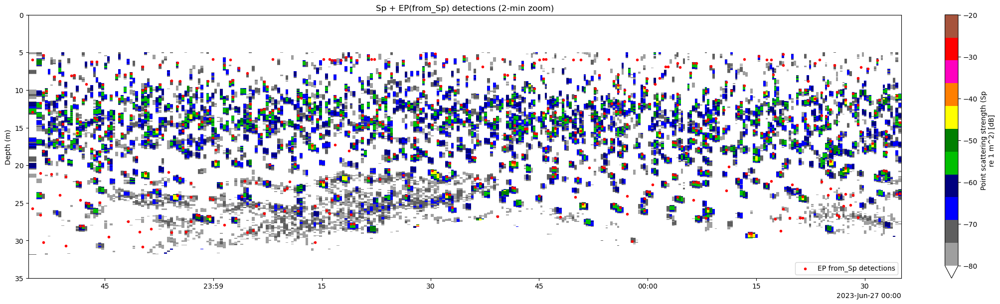

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import echopype.colormap

vmin, vmax = -80, -20
cmap = mpl.colormaps["ep.ek500"]

t0 = ds_m2["ping_time"].isel(ping_time=0).values
t1 = t0 + np.timedelta64(2, "m")

ds_zoom = ds_m2.sel(ping_time=slice(t0, t1))

da = ds_zoom["Sp"]

y_name = "depth"
y1d = ds_zoom["depth"].values.astype(float)

valid = np.isfinite(y1d)

da_plot = (
    da.isel(range_sample=valid)
      .assign_coords(depth=("range_sample", y1d[valid]))
      .sortby("depth")
)

fig, ax = plt.subplots(figsize=(20, 6), constrained_layout=True)

qm = da_plot.plot(
    ax=ax,
    x="ping_time",
    y="depth",
    yincrease=False,
    cmap=cmap,
    vmin=vmin,
    vmax=vmax,
    add_colorbar=True,
)

qm.cmap.set_under("white")
qm.cmap.set_over("#5c2e00")

det_t = st_ev["ping_time"].values
det_z = st_ev["target_range"].values

tmin = ds_zoom["ping_time"].values.min()
tmax = ds_zoom["ping_time"].values.max()
m = (det_t >= tmin) & (det_t <= tmax)

ax.scatter(
    det_t[m],
    det_z[m],
    s=16,
    c="red",
    marker="o",
    linewidths=0,
    label="EP from_Sp detections",
)

ax.set_ylim(35, 0)
ax.set_title("Sp + EP(from_Sp) detections (2-min zoom)")
ax.set_xlabel("")
ax.set_ylabel("Depth (m)")
ax.legend(loc="lower right")
plt.show()

In [53]:
# Compute TS at from_Sp target locations, before compute_TS(point_locations=...) exists

it = st_ev["ping_index"].values.astype(int)
rs = st_ev["range_sample"].values.astype(int)

sp_peak = ds_m2["Sp"].values[it, rs]
ts_ev = sp_peak + st_ev["beam_comp_db"].values
r_ev = st_ev["target_range"].values

st_ev_ts = st_ev.assign(
    ts_comp=("target", ts_ev.astype(float)),
    ts_uncomp=("target", sp_peak.astype(float)),
)

# Apply TS threshold after detection, as in Echoview Method 2
st_ev_ts = st_ev_ts.where(st_ev_ts["ts_comp"] >= ts_threshold_db, drop=True)

print(st_ev_ts)

<xarray.Dataset> Size: 417kB
Dimensions:            (target: 3260)
Coordinates:
  * target             (target) int64 26kB 1 3 5 8 9 ... 4640 4641 4642 4643
Data variables: (12/15)
    ping_time          (target) datetime64[ns] 26kB 2023-06-26T23:58:35.01872...
    range_sample       (target) float64 26kB 374.0 340.0 687.0 ... 496.0 767.0
    frequency_nominal  (target) float64 26kB 3.8e+04 3.8e+04 ... 3.8e+04 3.8e+04
    ping_index         (target) float64 26kB 0.0 1.0 1.0 ... 2.666e+03 2.666e+03
    iinf               (target) float64 26kB 360.0 337.0 684.0 ... 493.0 764.0
    isup               (target) float64 26kB 378.0 355.0 702.0 ... 511.0 782.0
    ...                 ...
    angle_major_deg    (target) float64 26kB 2.311 -2.526 ... 1.516 0.8521
    angle_minor_deg    (target) float64 26kB 0.8338 -0.8814 ... -0.569 1.231
    beam_comp_db       (target) float64 26kB 3.998 3.991 2.142 ... 1.8 1.505
    plike_peak         (target) float64 26kB -97.01 -93.34 ... -98.96 -109.2
    t

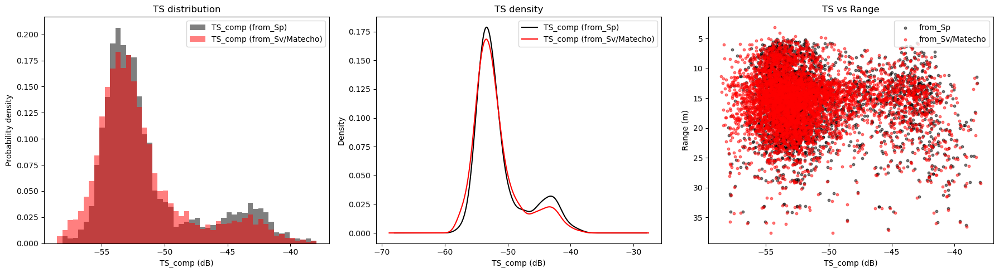

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

ts_ev = st_ev_ts["ts_comp"].to_numpy()
r_ev = st_ev_ts["target_range"].to_numpy()

ts_m = st_m["ts_comp"].to_numpy()
r_m = st_m["target_range"].to_numpy()

ev_ok = np.isfinite(ts_ev) & np.isfinite(r_ev)
m_ok = np.isfinite(ts_m) & np.isfinite(r_m)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

all_ts = np.concatenate([ts_ev[np.isfinite(ts_ev)], ts_m[np.isfinite(ts_m)]])
bins = np.linspace(all_ts.min(), all_ts.max(), 50)

axes[0].hist(ts_ev[np.isfinite(ts_ev)], bins=bins, density=True, alpha=0.5,
             color="black", label="TS_comp (from_Sp)")
axes[0].hist(ts_m[np.isfinite(ts_m)], bins=bins, density=True, alpha=0.5,
             color="red", label="TS_comp (from_Sv/Matecho)")
axes[0].set_xlabel("TS_comp (dB)")
axes[0].set_ylabel("Probability density")
axes[0].set_title("TS distribution")
axes[0].legend()

pd.Series(ts_ev).dropna().plot(kind="kde", ax=axes[1], color="black",
                               label="TS_comp (from_Sp)")
pd.Series(ts_m).dropna().plot(kind="kde", ax=axes[1], color="red",
                              label="TS_comp (from_Sv/Matecho)")
axes[1].set_xlabel("TS_comp (dB)")
axes[1].set_title("TS density")
axes[1].legend()

axes[2].scatter(ts_ev[ev_ok], r_ev[ev_ok], s=10, alpha=0.5,
                color="black", label="from_Sp")
axes[2].scatter(ts_m[m_ok], r_m[m_ok], s=10, alpha=0.5,
                color="red", label="from_Sv/Matecho")
axes[2].invert_yaxis()
axes[2].set_xlabel("TS_c    omp (dB)")
axes[2].set_ylabel("Range (m)")
axes[2].set_title("TS vs Range")
axes[2].legend()

plt.tight_layout()
plt.show()

We then enable dynamic visualisation of the masked TS echogram to inspect the water-column region and detected targets interactively.

> Notes
> Future updates to Echoshader will support direct visualisation of single-target detection results.

In [ ]:
%matplotlib widget

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.widgets import SpanSelector
import echopype.colormap

vmin_ts, vmax_ts = -80, -20
cmap_ts = mpl.colormaps["ep.ek500"]
ang_cmap = "RdBu_r"
ymax = 35

ds = ds_m2.sortby("ping_time")

depth1d = ds["depth"].values.astype(float)
valid = np.isfinite(depth1d)
idx = np.where(valid)[0]
depth1d = depth1d[valid]

def to_depth(da):
    return (
        da.isel(range_sample=idx)
          .assign_coords(depth=("range_sample", depth1d))
          .swap_dims({"range_sample": "depth"})
          .sortby("depth")
    )

TS = to_depth(ds["TS"])
Al = to_depth(ds["angle_alongship"])
At = to_depth(ds["angle_athwartship"])

bottom = ds["bottom"] if "bottom" in ds else None

# detections
ev_t = st_ev["ping_time"].values.astype("datetime64[ns]")
ev_z = st_ev["target_range"].values.astype(float)   # <-- FIX

m_t  = st_m["ping_time"].values.astype("datetime64[ns]")
m_z  = st_m["target_range"].values.astype(float)

fig, axes = plt.subplots(3, 1, figsize=(20, 12), sharex=True, constrained_layout=True)

# TS
qm0 = TS.plot(ax=axes[0], x="ping_time", y="depth", yincrease=False,
             cmap=cmap_ts, vmin=vmin_ts, vmax=vmax_ts,
             add_colorbar=True, infer_intervals=False)
qm0.cmap.set_under("white")
qm0.cmap.set_over("#5c2e00")

axes[0].scatter(ev_t, ev_z, s=16, c="red", marker="o", linewidths=0, label="Echoview method 2")
axes[0].scatter(m_t,  m_z,  s=28, facecolors="none", edgecolors="dodgerblue", linewidths=1.5, label="Matecho")

if bottom is not None:
    axes[0].plot(ds["ping_time"].values, bottom.values, "k-", lw=2, label="Bottom")

axes[0].set_ylim(ymax, 0)
axes[0].set_title("TS + detections (drag to zoom time)")
axes[0].legend(loc="lower right")

# Alongship
Al.plot(ax=axes[1], x="ping_time", y="depth", yincrease=False,
        cmap=ang_cmap, add_colorbar=True, infer_intervals=False)
axes[1].scatter(ev_t, ev_z, s=16, c="red", marker="o", linewidths=0)
axes[1].scatter(m_t,  m_z,  s=28, facecolors="none", edgecolors="dodgerblue", linewidths=1.5)
if bottom is not None:
    axes[1].plot(ds["ping_time"].values, bottom.values, "k-", lw=2)
axes[1].set_ylim(ymax, 0)
axes[1].set_title("Alongship angle")

# Athwartship
At.plot(ax=axes[2], x="ping_time", y="depth", yincrease=False,
        cmap=ang_cmap, add_colorbar=True, infer_intervals=False)
axes[2].scatter(ev_t, ev_z, s=16, c="red", marker="o", linewidths=0)
axes[2].scatter(m_t,  m_z,  s=28, facecolors="none", edgecolors="dodgerblue", linewidths=1.5)
if bottom is not None:
    axes[2].plot(ds["ping_time"].values, bottom.values, "k-", lw=2)
axes[2].set_ylim(ymax, 0)
axes[2].set_title("Athwartship angle")

# interactive zoom
def onselect(xmin, xmax):
    for ax in axes:
        ax.set_xlim(xmin, xmax)
    fig.canvas.draw_idle()

SpanSelector(
    axes[0], onselect,
    direction="horizontal",
    useblit=True,
    props=dict(alpha=0.2),
    interactive=True,
)

plt.show()

KeyError: "No variable named 'TS'. Variables on the dataset include ['channel', 'ping_time', 'range_sample', 'Sp', 'echo_range', ..., 'angle_athwartship', 'depth', 'tau_effective', 'sample_interval', 'beam_type']"

## Comparison of both detection approaches

Finally, we compare the split-beam single-target detections obtained with Echoview Method 2 and the Matecho implementation. We evaluate consistency in target strength (TS) distributions and depth–TS structure using histograms, kernel density estimates, and TS–range scatter plots.

In [ ]:
%matplotlib inline

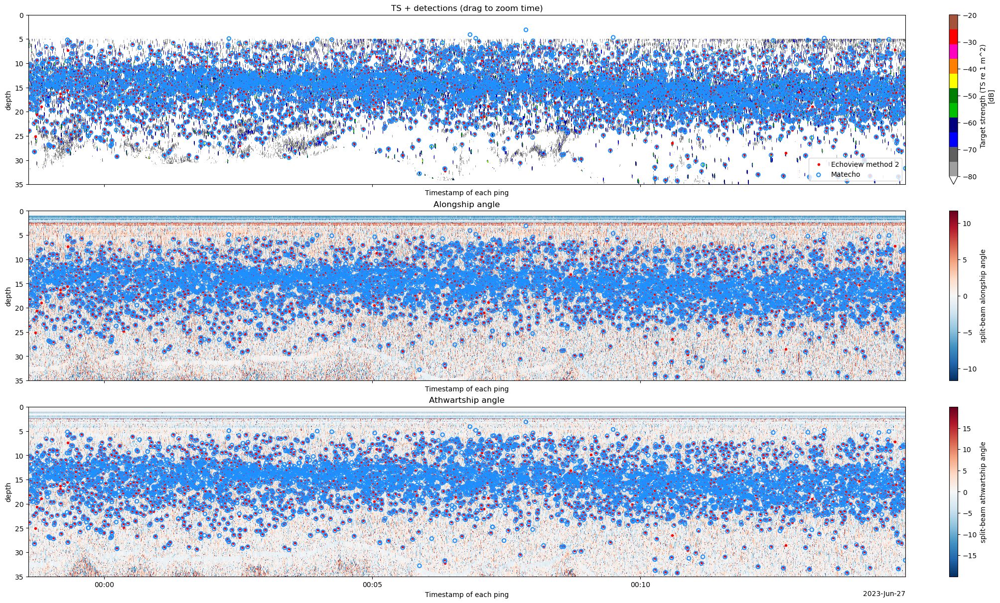

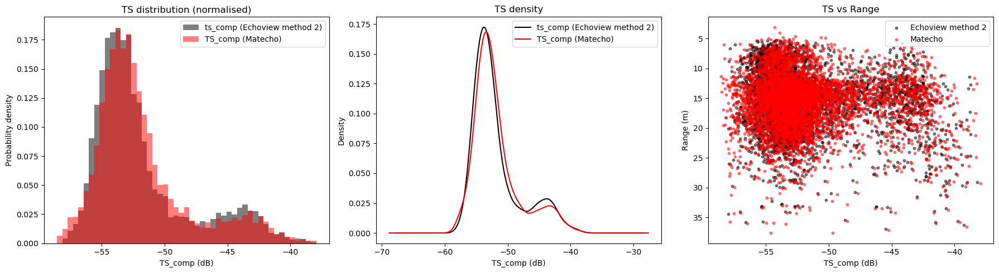

In [ ]:
# Extract arrays
ts_ev = st_ev["ts_comp"].to_numpy()
r_ev  = st_ev["target_range"].to_numpy()

ts_m  = st_m["ts_comp"].to_numpy()
r_m   = st_m["target_range"].to_numpy()

ev_ok = np.isfinite(ts_ev) & np.isfinite(r_ev)
m_ok  = np.isfinite(ts_m)  & np.isfinite(r_m)

# Figures
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Histogram (normalised)
all_ts = np.concatenate([ts_ev[np.isfinite(ts_ev)],
                         ts_m[np.isfinite(ts_m)]])
bins = np.linspace(all_ts.min(), all_ts.max(), 50)

axes[0].hist(ts_ev[np.isfinite(ts_ev)], bins=bins, density=True, alpha=0.5,
             color="black", label="ts_comp (Echoview method 2)")
axes[0].hist(ts_m[np.isfinite(ts_m)], bins=bins, density=True, alpha=0.5,
             color="red", label="TS_comp (Matecho)")

axes[0].set_xlabel("TS_comp (dB)")
axes[0].set_ylabel("Probability density")
axes[0].set_title("TS distribution (normalised)")
axes[0].legend()

# KDE
pd.Series(ts_ev).dropna().plot(kind="kde", ax=axes[1], color="black",
                               label="ts_comp (Echoview method 2)")
pd.Series(ts_m).dropna().plot(kind="kde", ax=axes[1], color="red",
                              label="TS_comp (Matecho)")

axes[1].set_xlabel("TS_comp (dB)")
axes[1].set_title("TS density")
axes[1].legend()

# TS vs Range
axes[2].scatter(ts_ev[ev_ok], r_ev[ev_ok], s=10, alpha=0.5,
                color="black", label="Echoview method 2")
axes[2].scatter(ts_m[m_ok], r_m[m_ok], s=10, alpha=0.5,
                color="red", label="Matecho")

axes[2].invert_yaxis()
axes[2].set_xlabel("TS_comp (dB)")
axes[2].set_ylabel("Range (m)")
axes[2].set_title("TS vs Range")
axes[2].legend()

plt.tight_layout()
plt.show()

End of notebook.

In [ ]:
import datetime
print(f"echopype: {ep.__version__}")
print(f"\n{datetime.datetime.now(datetime.UTC)}")

echopype: 0.11.2.dev18+gf58dd2eb2.d20260429

2026-05-06 23:50:05.823123+00:00
